In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
df = pd.read_csv('/Users/Dennis/Downloads/Pydsci-master/Python_book/8Logistic/accepts.csv')
df.head()

,application_id,account_number,bad_ind,vehicle_year,vehicle_make,bankruptcy_ind,tot_derog,tot_tr,age_oldest_tr,tot_open_tr,...,purch_price,msrp,down_pyt,loan_term,loan_amt,ltv,tot_income,veh_mileage,used_ind,weight
0,2314049,11613,1,1998.0,FORD,N,7.0,9.0,64.0,2.0,...,17200.00,17350.0,0.00,36,17200.00,99.0,6550.00,24000.0,1,1.00
1,63539,13449,0,2000.0,DAEWOO,N,0.0,21.0,240.0,11.0,...,19588.54,19788.0,683.54,60,19588.54,99.0,4666.67,22.0,0,4.75
2,7328510,14323,1,1998.0,PLYMOUTH,N,7.0,10.0,60.0,NaN,...,13595.00,11450.0,0.00,60,10500.00,92.0,2000.00,19600.0,1,1.00
3,8725187,15359,1,1997.0,FORD,N,3.0,10.0,35.0,5.0,...,12999.00,12100.0,3099.00,60,10800.00,118.0,1500.00,10000.0,1,1.00
4,4275127,15812,0,2000.0,TOYOTA,N,0.0,10.0,104.0,2.0,...,26328.04,22024.0,0.00,60,26328.04,122.0,4144.00,14.0,0,4.75


In [4]:
df = df.dropna(axis = 0  , how = 'any')
target =df['bad_ind']
data = df.ix[:,'bankruptcy_ind':'used_ind']
data.head()

/Users/Dennis/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  This is separate from the ipykernel package so we can avoid doing imports until


,bankruptcy_ind,tot_derog,tot_tr,age_oldest_tr,tot_open_tr,tot_rev_tr,tot_rev_debt,tot_rev_line,rev_util,fico_score,purch_price,msrp,down_pyt,loan_term,loan_amt,ltv,tot_income,veh_mileage,used_ind
0,N,7.0,9.0,64.0,2.0,1.0,506.0,500.0,101,650.0,17200.00,17350.0,0.00,36,17200.00,99.0,6550.00,24000.0,1
1,N,0.0,21.0,240.0,11.0,7.0,34605.0,57241.0,60,649.0,19588.54,19788.0,683.54,60,19588.54,99.0,4666.67,22.0,0
3,N,3.0,10.0,35.0,5.0,4.0,4019.0,5946.0,68,603.0,12999.00,12100.0,3099.00,60,10800.00,118.0,1500.00,10000.0,1
4,N,0.0,10.0,104.0,2.0,0.0,0.0,1800.0,0,764.0,26328.04,22024.0,0.00,60,26328.04,122.0,4144.00,14.0,0
5,Y,2.0,15.0,136.0,4.0,3.0,3651.0,5747.0,64,680.0,26272.72,26375.0,0.00,36,26272.72,100.0,5400.00,1.0,0


In [7]:
data['lti_temp'] = data['loan_amt']/data['tot_income']
data['lti_temp'] = data['lti_temp'].map(lambda x:10 if x >=10 else x)
del data['loan_amt']
data['bankruptcy_ind'] = data['bankruptcy_ind'].replace({'N':0 , 'Y':1})
data.head()

,bankruptcy_ind,tot_derog,tot_tr,age_oldest_tr,tot_open_tr,tot_rev_tr,tot_rev_debt,tot_rev_line,rev_util,fico_score,purch_price,msrp,down_pyt,loan_term,ltv,tot_income,veh_mileage,used_ind,lti_temp
0,0,7.0,9.0,64.0,2.0,1.0,506.0,500.0,101,650.0,17200.00,17350.0,0.00,36,99.0,6550.00,24000.0,1,2.625954
1,0,0.0,21.0,240.0,11.0,7.0,34605.0,57241.0,60,649.0,19588.54,19788.0,683.54,60,99.0,4666.67,22.0,0,4.197541
3,0,3.0,10.0,35.0,5.0,4.0,4019.0,5946.0,68,603.0,12999.00,12100.0,3099.00,60,118.0,1500.00,10000.0,1,7.200000
4,0,0.0,10.0,104.0,2.0,0.0,0.0,1800.0,0,764.0,26328.04,22024.0,0.00,60,122.0,4144.00,14.0,0,6.353292
5,1,2.0,15.0,136.0,4.0,3.0,3651.0,5747.0,64,680.0,26272.72,26375.0,0.00,36,100.0,5400.00,1.0,0,4.865319


In [9]:
from sklearn.model_selection import train_test_split
train_data , test_data ,train_target , test_target = train_test_split(data , target , test_size = 0.2 , train_size = 0.8, random_state = 42)

In [11]:
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier(criterion='gini' , max_depth=3 , class_weight=None , random_state=1234)
clf.fit(train_data , train_target)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=3,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=1234,
            splitter='best')

In [13]:
import sklearn.metrics as metrics
print(metrics.classification_report(test_target , clf.predict(test_data)))

              precision    recall  f1-score   support

           0       0.82      0.99      0.90       667
           1       0.56      0.06      0.12       154

   micro avg       0.81      0.81      0.81       821
   macro avg       0.69      0.53      0.51       821
weighted avg       0.77      0.81      0.75       821



In [20]:
params = {'class_weight':{0:1 , 1:3}}
clf.set_params(**params)
clf.fit(train_data , train_target)
print(metrics.classification_report(test_target , clf.predict(test_data)))

              precision    recall  f1-score   support

           0       0.88      0.74      0.81       667
           1       0.33      0.55      0.41       154

   micro avg       0.71      0.71      0.71       821
   macro avg       0.60      0.65      0.61       821
weighted avg       0.78      0.71      0.73       821



In [21]:
list(zip(data.columns , clf.feature_importances_))

[('bankruptcy_ind', 0.0),
 ('tot_derog', 0.0),
 ('tot_tr', 0.0),
 ('age_oldest_tr', 0.0),
 ('tot_open_tr', 0.0),
 ('tot_rev_tr', 0.0),
 ('tot_rev_debt', 0.0),
 ('tot_rev_line', 0.15738458848916786),
 ('rev_util', 0.0),
 ('fico_score', 0.7184265936524556),
 ('purch_price', 0.0),
 ('msrp', 0.0),
 ('down_pyt', 0.0),
 ('loan_term', 0.0),
 ('ltv', 0.12418881785837653),
 ('tot_income', 0.0),
 ('veh_mileage', 0.0),
 ('used_ind', 0.0),
 ('lti_temp', 0.0)]

In [22]:
df  = pd.read_csv('/Users/Dennis/Downloads/Pydsci-master/Python_book/11KNNNB/date_data2.csv')
df.describe()

,income,attractive,assets,edueduclass,Dated,income_rank,attractive_rank,assets_rank
count,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
mean,9010.000000,50.500000,96.006300,3.710000,0.500000,1.550000,1.560000,1.510000
std,5832.675288,28.810948,91.082226,1.225116,0.502519,1.140397,1.103896,1.123621
min,3000.000000,1.000000,3.728400,1.000000,0.000000,0.000000,0.000000,0.000000
25%,5000.000000,28.000000,31.665269,3.000000,0.000000,1.000000,1.000000,0.750000
50%,7500.000000,51.000000,70.746924,4.000000,0.500000,2.000000,2.000000,2.000000
75%,11500.000000,68.875000,131.481061,4.000000,1.000000,3.000000,2.250000,2.250000
max,34000.000000,99.500000,486.311758,6.000000,1.000000,3.000000,3.000000,3.000000


In [23]:
X = df.ix[:,:4]
Y = df[['Dated']]

/Users/Dennis/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """Entry point for launching an IPython kernel.


In [26]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import preprocessing
min_max_scaler = preprocessaing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(X)
x_scaled[1:5]

/Users/Dennis/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


array([[0.        , 0.13705584, 0.07649535, 0.6       ],
       [0.        , 0.05076142, 0.00293644, 0.        ],
       [0.        , 0.        , 0.00691908, 0.        ],
       [0.01612903, 0.13705584, 0.        , 0.2       ]])

In [38]:
from sklearn.model_selection import train_test_split
train_data , test_data , train_target , test_target =train_test_split(x_scaled , Y , test_size= 0.25 , train_size = 0.75,
                                                                random_state = 42)


In [39]:
model = KNeighborsClassifier(n_neighbors=3)
model.fit(train_data , train_target.values.flatten())
test_est = model.predict(test_data)
import sklearn.metrics as metrics
print(metrics.classification_report(test_target , test_est))

              precision    recall  f1-score   support

           0       0.94      0.88      0.91        17
           1       0.78      0.88      0.82         8

   micro avg       0.88      0.88      0.88        25
   macro avg       0.86      0.88      0.87        25
weighted avg       0.89      0.88      0.88        25



In [45]:
for k in range(1,10):
    k_model = KNeighborsClassifier(n_neighbors=k)
    k_model.fit(train_data , train_target.values.flatten())
    score = k_model.score(test_data , test_target)
    print('when k = %s , the score is %.4f'%(k,score))

when k = 1 , the score is 0.8800
when k = 2 , the score is 0.8800
when k = 3 , the score is 0.8800
when k = 4 , the score is 0.8800
when k = 5 , the score is 0.8000
when k = 6 , the score is 0.9200
when k = 7 , the score is 0.8000
when k = 8 , the score is 0.8400
when k = 9 , the score is 0.8400


In [46]:
metrics.roc_auc_score(test_target , k_model.predict(test_data))

0.8823529411764706

In [50]:
orgData = df.ix[:,-3:]
train_data , test_data , train_target , test_target = train_test_split(orgData ,Y , train_size = 0.8 , test_size = 0.2 , random_state = 42)


/Users/Dennis/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """Entry point for launching an IPython kernel.


In [52]:
from sklearn.naive_bayes import BernoulliNB
nb = BernoulliNB(alpha=1)
nb.fit(train_data , train_target)
print(metrics.classification_report(test_target , nb.predict(test_data)))

              precision    recall  f1-score   support

           0       1.00      0.47      0.64        15
           1       0.38      1.00      0.56         5

   micro avg       0.60      0.60      0.60        20
   macro avg       0.69      0.73      0.60        20
weighted avg       0.85      0.60      0.62        20



/Users/Dennis/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [146]:
df  = pd.read_csv('/Users/Dennis/Downloads/Pydsci-master/Python_book/4Describe/sndHsPr.csv')
df.head()

,dist,roomnum,halls,AREA,floor,subway,school,price
0,chaoyang,1,0,46.06,middle,1,0,48850
1,chaoyang,1,1,59.09,middle,1,0,46540
2,haidian,5,2,278.95,high,1,1,71662
3,haidian,3,2,207.00,high,1,1,57972
4,fengtai,2,1,53.32,low,1,1,71268


(array([0, 1, 2, 3, 4, 5]), <a list of 6 Text xticklabel objects>)

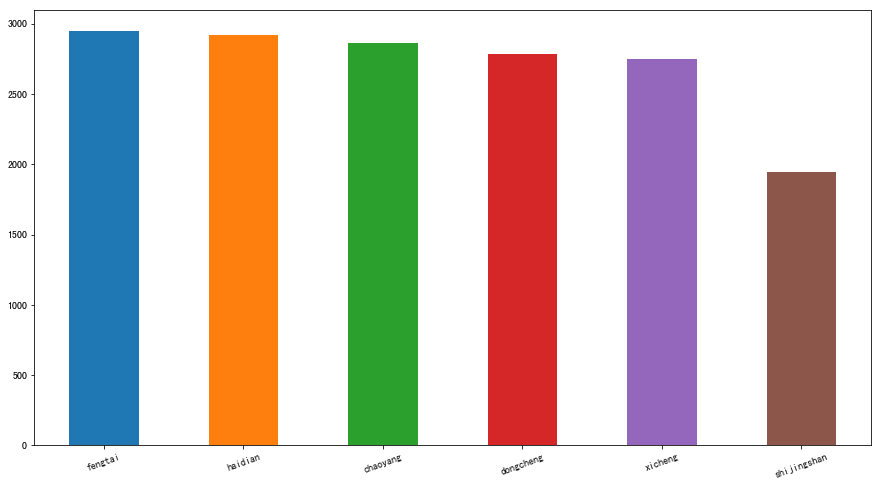

In [148]:
plt.figure(figsize = (15,8))
df.dist.value_counts().plot(kind = 'bar')
plt.xticks(rotation = 20)

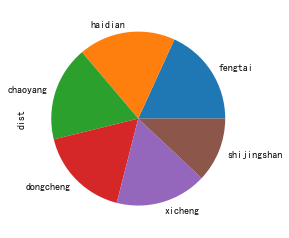

In [9]:
df.dist.value_counts().plot(kind = 'pie')

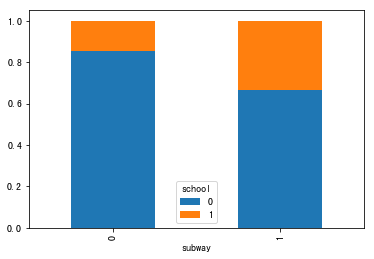

In [15]:
c = pd.crosstab(df.subway , df.school)
k = c.div(c.sum(1) , axis = 0)
k.plot(kind = 'bar' ,stacked= True)

In [18]:
df.price.groupby(df.dist).agg(['mean' , 'max' , 'min'])

,mean,max,min
dist,,,
chaoyang,52800.624651,124800,23011
dongcheng,71883.595041,149254,20089
fengtai,42500.904309,87838,18348
haidian,68757.602261,135105,25568
shijingshan,40286.889574,100000,18854
xicheng,85674.778545,149871,21918


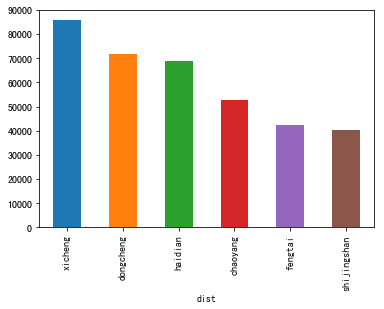

In [22]:
df.price.groupby(df.dist).mean().sort_values(ascending = False).plot(kind = 'bar')

In [26]:
df = df.assign(cc = df.school-df.subway)
df.drop('cc',axis = 1)

,dist,roomnum,halls,AREA,floor,subway,school,price
0,chaoyang,1,0,46.06,middle,1,0,48850
1,chaoyang,1,1,59.09,middle,1,0,46540
2,haidian,5,2,278.95,high,1,1,71662
3,haidian,3,2,207.00,high,1,1,57972
4,fengtai,2,1,53.32,low,1,1,71268
5,fengtai,2,1,58.00,low,1,1,70690
6,haidian,2,1,55.80,low,1,1,57348
7,haidian,2,1,58.90,middle,1,1,55179
8,haidian,2,1,66.90,middle,1,1,45591
9,fengtai,2,2,53.00,middle,1,0,73585


In [34]:
df[df.duplicated()]

,dist,roomnum,halls,AREA,floor,subway,school,price,cc
1372,chaoyang,1,1,67.00,low,1,0,42538,-1
4138,dongcheng,2,1,60.00,high,1,1,75000,0
7350,haidian,2,1,59.90,high,1,1,88481,0
8316,xicheng,2,1,60.00,high,1,1,75000,0
8734,shijingshan,2,1,76.68,high,1,0,34168,-1
9414,fengtai,2,1,96.69,high,1,0,39301,-1
9954,fengtai,3,2,129.00,low,1,0,49613,-1
10891,fengtai,1,1,60.00,high,1,0,33334,-1
10988,chaoyang,2,1,85.00,low,1,0,44706,-1
11547,fengtai,2,1,60.00,low,0,0,40000,0


In [53]:
df = pd.read_csv('/Users/Dennis/Downloads/Pydsci-master/Python_book/5Preprocessing/RFM_TRAD_FLOW.csv',encoding = 'gbk')
df.head()

,transID,cumid,time,amount,type_label,type
0,9407,10001,14JUN09:17:58:34,199.0,正常,Normal
1,9625,10001,16JUN09:15:09:13,369.0,正常,Normal
2,11837,10001,01JUL09:14:50:36,369.0,正常,Normal
3,26629,10001,14DEC09:18:05:32,359.0,正常,Normal
4,30850,10001,12APR10:13:02:20,399.0,正常,Normal


In [44]:
M = df.groupby(['cumid' , 'type'])[['amount']].sum()
M_trans = pd.pivot_table(M , index='cumid' , columns='type' , values = 'amount')
M_trans['Special_offer'] = M_trans['Special_offer'].fillna(0)
M_trans['specail_ratio'] = M_trans['Special_offer']/(M_trans['Special_offer'] + M_trans['Normal'])
M_trans.sort_values('specail_ratio' , ascending = False ).head()

type,Normal,Presented,Special_offer,returned_goods,specail_ratio
cumid,,,,,
10151,765.0,0.0,870.0,NaN,0.532110
40033,1206.0,0.0,761.0,-848.0,0.386884
40236,1155.0,0.0,691.0,-793.0,0.374323
30225,1475.0,0.0,738.0,-301.0,0.333484
20068,1631.0,0.0,731.0,-239.0,0.309483


In [54]:
travel = pd.read_csv('/Users/Dennis/data_science/toydata/government/歷年來台旅客國籍統計.csv',encoding = 'big5')
travel.head()

,國籍,細分,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,亞洲地區,日本 Japan,977705,"659,972","890,444","1,127,184","1,163,835","1,170,582","1,090,585","1,007,618","1,102,054","1,300,022","1,443,009","1,434,346","1,637,264","1,629,193","1,896,456"
1,亞洲地區,"韓國 Korea,Republic of",86408,"94,060","149,182","184,559","198,507","228,582","252,973","170,646","223,940","246,149","262,340","355,473","531,703","662,670","887,412"
2,亞洲地區,印度 India,17379,"15,817","20,538","21,986","22,463","24,678","23,327","22,126","28,931","28,048","27,659","28,321","34,332","36,833","38,331"
3,亞洲地區,中東 Middle East,10224,"8,422","12,838","13,262","12,687","13,446","12,356","12,182","13,349","13,361","12,608","13,758","15,734","16,800","17,453"
4,亞洲地區,東南亞地區 馬來西亞 Malaysia,66516,"75,869","105,246","123,961","132,996","159,839","171,630","184,577","311,349","331,744","367,817","424,053","464,518","458,401","500,496"


In [59]:
import numpy as np
import statsmodels.api as sm
from statsmodels.formula.api import ols

,id,Acc,avg_exp,avg_exp_ln,gender,Age,Income,Ownrent,Selfempl,dist_home_val,dist_avg_income,age2,high_avg,edu_class
0,19,1,1217.03,7.104168743,1,40,16.03515,1,1,99.93,15.932789,1600,0.102361,3
1,5,1,1251.5,7.132098111,1,32,15.84750,1,0,49.88,15.796316,1024,0.051184,2
2,95,0,,,1,36,8.40000,0,0,88.61,7.490000,1296,0.910000,1
3,86,1,856.57,6.752936042,1,41,11.47285,1,0,16.10,11.275632,1681,0.197218,3
4,50,1,1321.83,7.186772419,1,28,13.40915,1,0,100.39,13.346474,784,0.062676,2


In [67]:
raw = pd.read_csv('/Users/Dennis/Downloads/Pydsci-master/Python_book/7Linearmodel/creditcard_exp.csv')
raw.head()
exp = raw[raw.avg_exp.notnull()].copy().iloc[:,2:].drop('age2',axis = 1)
exp.describe(include = 'all')

,avg_exp,avg_exp_ln,gender,Age,Income,Ownrent,Selfempl,dist_home_val,dist_avg_income,high_avg,edu_class
count,100,100,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
unique,71,71,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,30,30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,0.240000,32.080000,6.142094,0.270000,0.110000,71.092800,6.646331,-0.504237,1.490000
std,NaN,NaN,0.429235,7.828567,3.325640,0.446196,0.314466,36.973676,3.371692,0.466883,1.029808
min,NaN,NaN,0.000000,20.000000,1.500000,0.000000,0.000000,6.310000,1.840000,-1.526850,0.000000
25%,NaN,NaN,0.000000,26.000000,3.879787,0.000000,0.000000,40.152500,4.346868,-0.824868,1.000000
50%,NaN,NaN,0.000000,31.000000,5.535200,0.000000,0.000000,66.535000,5.971105,-0.561270,1.000000
75%,NaN,NaN,0.000000,37.000000,7.791238,1.000000,0.000000,100.522500,8.352039,-0.220382,2.000000


In [68]:
exp[['Income' , 'avg_exp' , 'Age' , 'dist_home_val']].corr(method = 'pearson')

,Income,Age,dist_home_val
Income,1.000000,0.119538,0.247363
Age,0.119538,1.000000,-0.002336
dist_home_val,0.247363,-0.002336,1.000000


In [87]:
import re
p1 = 'cat'
p2 = 'dog'
text = 'dog runs to cat'
re.search(p1 , text)
re.search(p2 , text)
ptn = r'r[au]n'
re.search(ptn , text)
ptn = r'r[a-z]n'
re.search(ptn , text)
ptn = r'r[A-Z]n'
re.search(ptn ,text)
text = 'ID: 020153 , Date:2017/10/11'
match = re.search(r'(?P<id>\d+) , Date:(?P<date>.+)' ,text)
print(match.group('id'))
re.sub(r'r[a-z]n' , 'catches' , 'dog runs to catch')

020153


'dog catchess to catch'

In [108]:
text = 'dog runs to catch'
compile_re = re.compile(r'r[a-z]n')
compile_re.search(text)
re.findall( '.og', text)
re.match('ssss' , 'ssssasdssd')
re.search(r'\d[a-zA-Z]' , '0Aa')

<re.Match object; span=(0, 2), match='0A'>

In [109]:
from selenium import webdriver
driver = webdriver.Chrome('/Users/Dennis/chromedriver')

In [112]:
# with open('~' , 'r' , encoding = 'utf8') as f:
#     for line in f:
#         print(line)
# import sqlite3
# conn = sqlite3.connect('test.sqlite3')
# sqlstr = "create tabel if not exist table01 \("num" integer primary key not null , "tel" TEXT)"
# cursor.execute(sqlstr)
# sqlstr = "select * from table01 where num=1"

In [114]:
plotly.offline.init_notebook_mode(connected=True)
from FinMind.Data import GoldPrice

In [119]:

from FinMind.Data import Load
import datetime

date = str( datetime.datetime.now().date() - datetime.timedelta(30) )
date2 = str( datetime.datetime.now().date() - datetime.timedelta(200) )
date3 = str( datetime.datetime.now().date() - datetime.timedelta(400) )
#---------------------------------------------------------------
print('load TaiwanStockInfo')
TaiwanStockInfo = Load.FinData(dataset = 'TaiwanStockInfo')

load TaiwanStockInfo


In [129]:
tw = Load.FinData(dataset = 'ExchangeRate',select = ['Taiwan'],date = '2010-10-10')
gp = Load.FinData(dataset='GoldPrice'  , date = '2010-10-10')

In [132]:
import plotly
from plotly.graph_objs import Scatter,Layout
import plotly.offline as po
date = gp.date
price = gp.Price
data = [Scatter(x =gp.date , y= gp.Price , name = "金價" ) , Scatter(x=tw.date , y = tw.InterbankRate , name = '臺幣對美元')]
po.iplot({
    'data':data ,  'layout':Layout(title = '金對臺幣的價格序列')
})

In [138]:
raw = pd.read_csv('/Users/Dennis/Downloads/Pydsci-master/Python_book/7Linearmodel/creditcard_exp.csv')
raw.head()
exp = raw[raw.avg_exp.notnull()].copy().iloc[:,2:].drop('age2',axis = 1)
exp_new = raw[raw.avg_exp.isnull()].copy().iloc[:,2:].drop('age2',axis = 1)
exp.describe(include = 'all')

,avg_exp,avg_exp_ln,gender,Age,Income,Ownrent,Selfempl,dist_home_val,dist_avg_income,high_avg,edu_class
count,100,100,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
unique,71,71,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,30,30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,0.240000,32.080000,6.142094,0.270000,0.110000,71.092800,6.646331,-0.504237,1.490000
std,NaN,NaN,0.429235,7.828567,3.325640,0.446196,0.314466,36.973676,3.371692,0.466883,1.029808
min,NaN,NaN,0.000000,20.000000,1.500000,0.000000,0.000000,6.310000,1.840000,-1.526850,0.000000
25%,NaN,NaN,0.000000,26.000000,3.879787,0.000000,0.000000,40.152500,4.346868,-0.824868,1.000000
50%,NaN,NaN,0.000000,31.000000,5.535200,0.000000,0.000000,66.535000,5.971105,-0.561270,1.000000
75%,NaN,NaN,0.000000,37.000000,7.791238,1.000000,0.000000,100.522500,8.352039,-0.220382,2.000000


In [141]:
import statsmodels.api as sm
from statsmodels.formula.api import ols